# Trabalho final de Processamento Digital de Sinais

## Assunto: Projeto e Implementação de Filtro Digital


Para um dado problema de PDS, projetar um Filtro Digital e simular e implementar o filtro, interpretando os sinais de entrada e de saída, nos domínios do tempo discreto e da frequência. O projeto e a implementação do filtro deve contemplar as seguintes etapas.

- 1. Definir o sinal em tempo contínuo;
- 2. Análise do sinal contínuo no domínio da frequência;
- 3. Definir o filtro anti-aliasing e a frequência de amostragem apropriada;
- 4. Amostrar e reconstruir o sinal contínuo;
- 5. Análise do sinal discreto no domínio da frequência;
- 6. Definir a banda de frequência de interesse de acordo com a aplicação selecionada;
- 7. Definir as especificações do Filtro Digital e Projetar o Filtro;
- 8. Análise do sinal de saída do filtro digital;
- 9. Comentar e justificar todas as etapas;
- 10. Simulação e implementação completa

O trabalho deverá ser exposto em sessão oral em sala de aula, com tempo máximo de apresentação de 15 minutos, no dia 27 de Junho de 2022. Os recursos disponíveis serão: COLAB, projetor multimídia e quadro branco.


- Discente: Keven Henrique Miranda Chaves
- Matricula: 201833840020

### Utilizando o biblioteca soundfile para armazenar o sinal do áudio

In [68]:
!pip install soundfile

### Bibliotecas utilizadas

In [69]:
import numpy as np
import matplotlib.pyplot as plt 
import soundfile as sf
from IPython.display import Audio
from scipy.signal import butter, lfilter, filtfilt
from scipy import signal

## Armazenando as variáveis para desenvolvimento do trabalho

### Armazenando sinal, taxa de amostragem, tempo e mostrando informações

- signal, samplerate = sinal e taxa de amostragem (fs)
- time = array de 0 ao produto de 1/tx de amostragem com tamanho do sinal, e de passo em passo 1 dividido pela tx de amostragem

- tempo em segundos
- sinal em domínio do tempo
- audio_noast = audio com ruído (problema)

In [70]:
audio_noast = 'explosion.wav'                                  #Caminho do arquivo de áudio;
problem = Audio(filename = audio_noast)                        #Variável do áudio com ruído;
_signal, samplerate = sf.read(audio_noast)                     #Variáveis de sinal de áudio e taxa de amostragem;
time = np.arange(0, len(_signal)*1/samplerate, 1/samplerate)   #Cria um tempo com mesmo tamanho de tempo de áudio
print(sf.info(audio_noast))                                    #Mostra informações relevantes do áudio em questão
print('n_Frames: ', _signal.size)

explosion.wav
samplerate: 44100 Hz
channels: 2
duration: 16.379 s
format: WAV (Microsoft) [WAV]
subtype: Signed 16 bit PCM [PCM_16]
n_Frames:  1444608


### Nosso problema pode ser executado apenas printando o áudio.

In [71]:
problem

### Criando métodos para facilitar o desenvolvimento do notebook

- Método para plotar gráficos com as definições padrões
- Método para transformada de Fourier (numpy)

In [72]:
def show_graph(x, y, title, x_label):
    plt.figure(figsize=(15,7))
    plt.plot(x, y, 'seagreen')
    plt.xlabel(x_label, fontdict={'fontsize':18})
    plt.ylabel('Amplitude', fontdict={'fontsize':18})
    plt.title(title, fontdict={'fontsize':18}, pad=25)
    plt.show()
    
def transformada_fourier(_sinal):
    frequency_domine = np.fft.fft(_signal)
    magnitude = np.abs(frequency_domine)
    return magnitude

### Plotando gráfico do sinal em domínio do tempo (s)

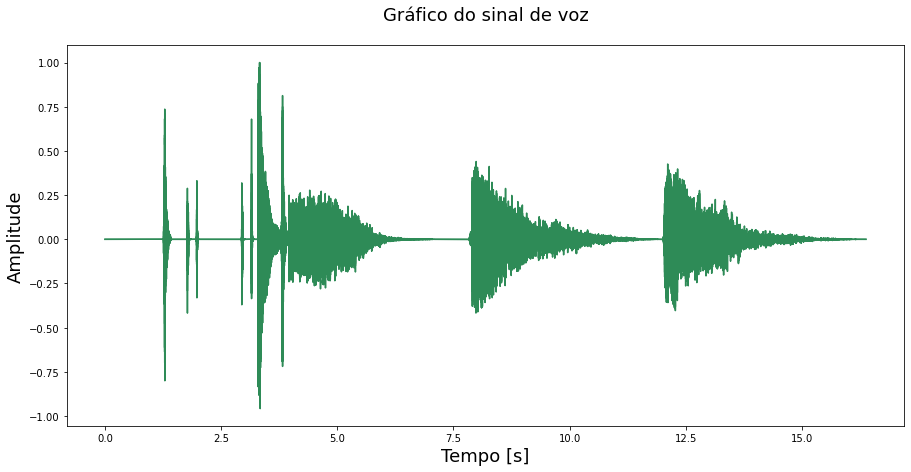

In [73]:
show_graph(time, _signal, 'Gráfico do sinal de voz', 'Tempo [s]')

### Transformada de Fourier

####  - Um pouco sobre a transformada de fourier

A transformada de Fourier é comumente usada para converter um sinal no tempo em um espectro de frequência. Esse método utiliza o fato de que toda função não-linear pode ser representada como uma soma de ondas senoidais (infinitas). A transformada separa um sinal de tempo e retorna informações sobre a frequência de todas as ondas senoidais necessárias para simular o sinal de tempo. (fonte: https://www.monolitonimbus.com.br/transformada-de-fourier-em-python/)


- Transformada de Fourier

Para sequências de valores uniformemente espaçados, a Transformada Discreta de Fourier (“Discrete Fourier Transform” – DFT) é definida como:

![Transformada de Fourier](https://maestrovirtuale.com/wp-content/uploads/2019/10/tdf-2.gif)


Onde:

    N = número de amostras
    n = n-ésima amostra (ordem do harmônico)
    k = frequência atual (0 Hz a N-1 Hz)
    X[k] = números complexos resultantes da DFT (amplitude e fase)
    xn = números complexos (com parte imaginária nula ou não) do valor do sinal no instante n
    
    
####  - Biblioteca utilizada

Foi utilizada a biblioteca numpy para realização da transformada rápida de fourier.
a função Numpy.fft.fft() é responsável por gerar a partir do sinal de entrada, valores discretos em relação a frenquência em Hertz.

- Função que faz a transformada de fourier


In [74]:
mag = transformada_fourier(_signal)

### Plotando gráfico do sinal na faixa de frequência

Os gráficos a seguir são as representação dos sinais em domínio do tempo (s), domínio da frequência (Hz)

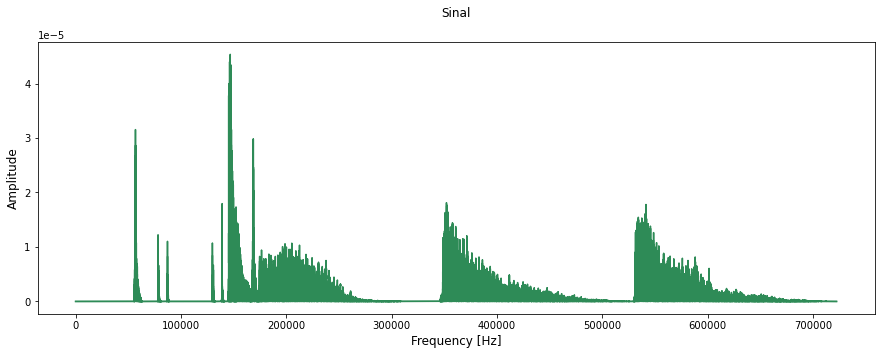

In [75]:
plt.figure(figsize=(15,5))
plt.plot(mag/samplerate, 'seagreen')
plt.xlabel('Frequency [Hz]', fontdict={'fontsize':12})
plt.ylabel('Amplitude', fontdict={'fontsize':12})
plt.title('Sinal', fontdict={'fontsize':12}, pad=25)
plt.show()

### Representação dos gráficos em domínio do tempo e frequência - analise descritiva.

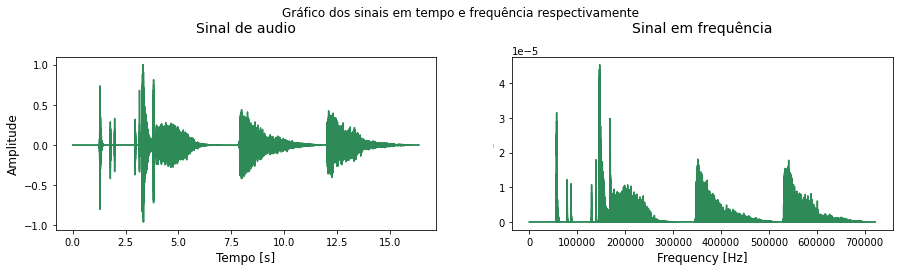

In [76]:
fig = plt.figure(figsize=(15,7))
fig.suptitle('Gráfico dos sinais em tempo e frequência respectivamente')

ax = plt.subplot(2,2,1)
ax.plot(time, _signal, 'seagreen')
ax.set_xlabel('Tempo [s]', fontdict={'fontsize':12})
ax.set_ylabel('Amplitude', fontdict={'fontsize':12})
ax.set_title('Sinal de audio', fontdict={'fontsize':14}, pad=25)


bx = plt.subplot(2,2,2)
bx.plot(mag/samplerate, 'seagreen')
bx.set_xlabel('Frequency [Hz]', fontdict={'fontsize':12})
bx.set_ylabel('Amplitude', fontdict={'fontsize':1})
bx.set_title('Sinal em frequência', fontdict={'fontsize':14}, pad=25)


plt.show()

## Filtro passa-faixa butterworth

- Utilização do passa-faixa para atenuar apenas frequências de uma certa faixa de frequência

![PASSA-FAIXA](https://upload.wikimedia.org/wikipedia/commons/thumb/f/f6/Bandwidth.svg/300px-Bandwidth.svg.png)


- A utilização desse filtro faz com que as bandpass fora atenuem a zero

- É utilizada a função para resposta em frequência do gráfico do filtro

In [77]:
def show_frequency_response(a,b, fc, fs):
    plt.figure(figsize=(10,3))
    w, h = signal.freqz(b, a, worN=8000)
    plt.plot(0.5 *fs*w/np.pi, np.abs(h), 'b')
    plt.plot(fc, 0.5 * np.sqrt(2), 'ko')
    plt.axvline(fc, color='k')
    plt.xlim(0, 0.5*fs)
    plt.title("Resposta em Frequência")
    plt.xlabel('Frequência [Hz]')
    plt.grid()
    plt.show()

def passband(_signal, fc_l, fc_h, fs):
    
    nyq = 0.5*fs
    low_cut = fc_l/nyq
    high_cut = fc_h/nyq
    order = 11
    b, a = signal.butter(order, [low_cut, high_cut], btype='bandpass', analog=False)
    r = signal.filtfilt(b, a, _signal, axis=0)
    
    show_frequency_response(a,b, fc_l, fs)
    
    return r

### Função para gerar o sinal atenuado

- fc_l = frequencia de corte baixa
- fc_h = frequencia de corte alta

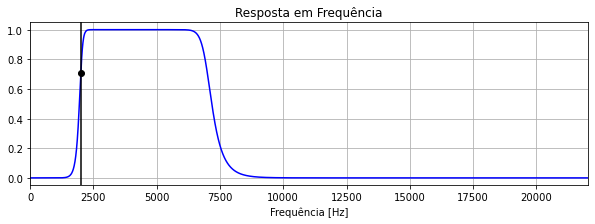

In [78]:
fc_l = 2000
fc_h = 7000
Fs = samplerate
y_sinal = passband(_signal, fc_l, fc_h, Fs)

## Gráfico comparativo entre os sinais antes e depois de filtrados

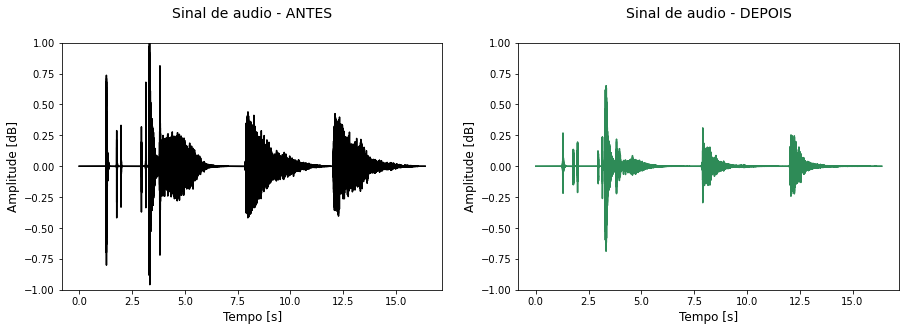

In [79]:
fig = plt.figure(figsize=(15,10))

ax1 = plt.subplot(2,2,1)
ax1.plot(time, _signal, 'k')
ax1.set_xlabel('Tempo [s]', fontdict={'fontsize':12})
ax1.set_ylabel('Amplitude [dB]', fontdict={'fontsize':12})
ax1.set_title('Sinal de audio - ANTES', fontdict={'fontsize':14}, pad=25)
ax1.set_ylim(-1,1)

ax = plt.subplot(2,2,2)
ax.plot(time, y_sinal, 'seagreen')
ax.set_xlabel('Tempo [s]', fontdict={'fontsize':12})
ax.set_ylabel('Amplitude [dB]', fontdict={'fontsize':12})
ax.set_title('Sinal de audio - DEPOIS', fontdict={'fontsize':14}, pad=25)
ax.set_ylim(-1,1)

plt.show()

## Transformada de fourier do sinal filtrado

In [80]:
filtered_mag = transformada_fourier(y_sinal)

## Gráfico comparativo entre os espectros antes e depois de filtrados

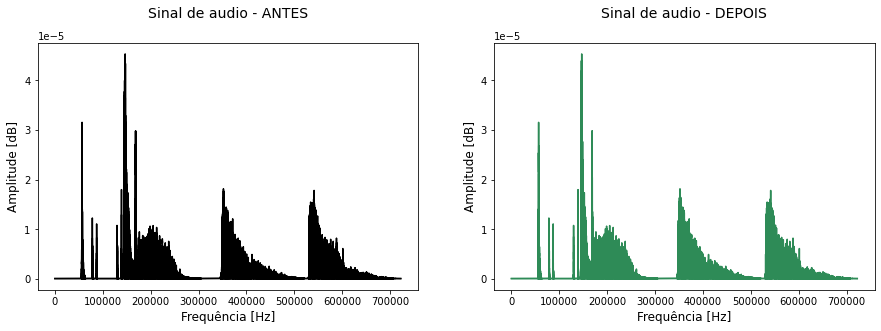

In [81]:
fig = plt.figure(figsize=(15,10))

ax1 = plt.subplot(2,2,1)
ax1.plot(mag/samplerate, 'k')
ax1.set_xlabel('Frequência [Hz]', fontdict={'fontsize':12})
ax1.set_ylabel('Amplitude [dB]', fontdict={'fontsize':12})
ax1.set_title('Sinal de audio - ANTES', fontdict={'fontsize':14}, pad=25)

ax = plt.subplot(2,2,2)
ax.plot(filtered_mag/samplerate, 'seagreen')
ax.set_xlabel('Frequência [Hz]', fontdict={'fontsize':12})
ax.set_ylabel('Amplitude [dB]', fontdict={'fontsize':12})
ax.set_title('Sinal de audio - DEPOIS', fontdict={'fontsize':14}, pad=25)

plt.show()

## Visão geral dos sinais (melhor percepção)

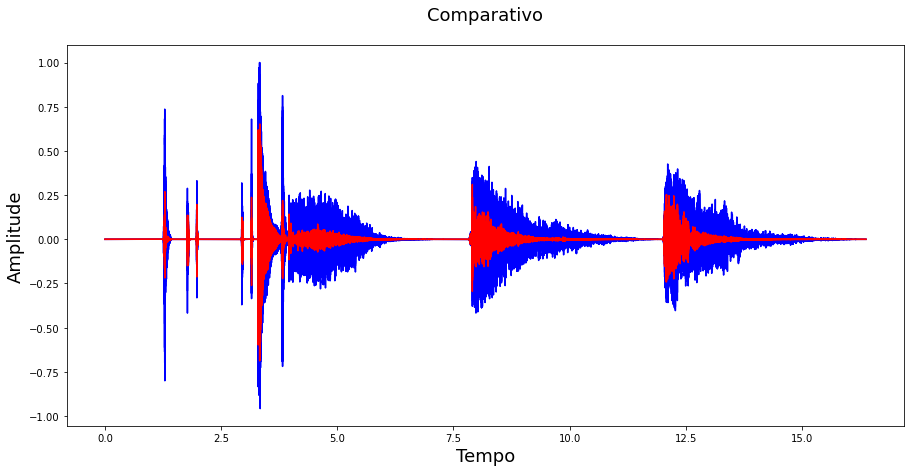

In [82]:
plt.figure(figsize=(15,7))
plt.plot(time, _signal, 'b')
plt.plot(time, y_sinal, 'r')
plt.xlabel('Tempo', fontdict={'fontsize':18})
plt.ylabel('Amplitude', fontdict={'fontsize':18})
plt.title('Comparativo', fontdict={'fontsize':18}, pad=25)
plt.show()

### Salva o arquivo de áudio no diretório do computador

In [83]:
from scipy.io.wavfile import read, write 
a = write('teste.wav', Fs, y_sinal)

### Executa audio filtrado dentro do notebook

In [84]:
Audio(filename = 'teste.wav')
